In [1]:
import numpy as np
import pandas as pd
import os
import random
from PIL import Image, ImageDraw
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import torch
import torchvision
from torchvision import transforms as T
from torchvision.models.detection. faster_rcnn import FastRCNNPredictor

/tmp/ipykernel_6782/2971124702.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
train= pd.read_csv("./data/train_solution_bounding_boxes (1).csv")

In [3]:
train.head()

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422


In [4]:
unique_imgs=train.image.unique()

In [5]:
class CustDat(torch.utils.data.Dataset):
  def __init__(self, df, unique_imgs, indices):
    self.df = df
    self.unique_imgs = unique_imgs
    self.indices= indices

  def __len__(self):
    return len(self.indices)

  def __getitem__(self, idx):
    image_name= self.unique_imgs[self.indices[idx]]
    boxes= self.df[self.df.image == image_name].values[:, 1:].astype("float")
    img = Image.open("./data/training_images/" + image_name ).convert('RGB')
    labels = torch.ones((boxes.shape[0]), dtype = torch.int64)
    target ={}
    target["boxes"] = torch.tensor (boxes)
    target["label"] = labels
    return T.ToTensor() (img), target

In [6]:
train_inds,val_inds=train_test_split(range(unique_imgs.shape[0]),test_size=0.1)

In [7]:
def custom_collate(data):
  return data

train_dl=torch.utils.data.DataLoader(CustDat(train,unique_imgs,train_inds),
                                     batch_size=8,
                                     shuffle=True,
                                     collate_fn=custom_collate,
                                     pin_memory=True if torch.cuda.is_available() else False)

val_dl=torch.utils.data.DataLoader(CustDat(train,unique_imgs,val_inds),
                                     batch_size=8,
                                     shuffle=True,
                                     collate_fn=custom_collate,
                                     pin_memory=True if torch.cuda.is_available() else False)

In [8]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained = True)
num_classes = 2
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [9]:
device= torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [10]:
optimizer= torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=0.0005)
num_epochs=10

In [11]:
model.to(device)
for epochs in range (num_epochs):
    epoch_loss = 0
    best_metric = float('inf')
    best_epoch = -1
    for data in train_dl:
        imgs = []
        targets = []
        for d in data:
            imgs.append(d[0].to(device))
            targ= {}
            targ["boxes"] = d[1]["boxes"].to(device)
            targ["labels"] = d[1]["label"].to(device)
            targets.append(targ)
        loss_dict = model(imgs, targets)
        loss = sum(v for v in loss_dict.values())
        epoch_loss += loss.cpu().detach().numpy()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if epoch_loss < best_metric:
        # Update the best metric and best epoch
            best_metric = epoch_loss
            best_epoch = epochs
            # Save the model with the current best performance
            torch.save(model.state_dict(), "best_model.pth")
    print(epoch_loss)

13.789716900386724
6.785907492197856
5.290974585105052
4.793357155465458
4.447867472973328
4.289954761823545
4.176474646978213
4.049494175628757
3.9140464382219338
3.801705997408619


In [12]:
model.eval()
data=iter(val_dl).__next__()

In [13]:
from IPython.display import display
from PIL import Image, ImageDraw

In [14]:
from torchvision.ops import box_iou

def compute_ap(gt_boxes, gt_labels, pred_boxes, pred_scores, iou_threshold=0.45, class_label=1, device='cpu'):


    # Sort predictions by score
    sort_idx = torch.argsort(pred_scores, descending=True)
    pred_boxes = pred_boxes[sort_idx]
    pred_scores = pred_scores[sort_idx]

    # Compute IoU between predicted and ground truth boxes
    iou = box_iou(pred_boxes, gt_boxes)

    # Find the best matching ground truth box for each prediction
    match_idx = iou.argmax(dim=1)
    match_iou = iou[range(iou.shape[0]), match_idx]

    # Initialize true positive and false positive arrays
    tp = torch.zeros_like(pred_scores)
    fp = torch.zeros_like(pred_scores)

    # Keep track of which ground truth boxes have already been matched
    matched = torch.zeros(gt_boxes.shape[0], dtype=torch.bool)

    # Loop over predictions
    for i in range(pred_scores.shape[0]):
        # If the prediction matches a ground truth box with IoU above the threshold
        if match_iou[i] >= iou_threshold:
            # If the ground truth box has not already been matched
            if not matched[match_idx[i]]:
                tp[i] = 1
                matched[match_idx[i]] = True
            else:
                fp[i] = 1
        else:
            fp[i] = 1

    # Compute precision and recall
    tp_cumsum = tp.cumsum(dim=0)
    fp_cumsum = fp.cumsum(dim=0)
    precision = tp_cumsum / (tp_cumsum + fp_cumsum)
    recall = tp_cumsum / gt_boxes.shape[0]

    # Add start and end points to precision-recall curve
    precision = torch.cat([torch.tensor([1.], device=device), precision, torch.tensor([0.], device=device)])
    recall = torch.cat([torch.tensor([0.], device=device), recall, torch.tensor([1.], device=device)])

    # Compute average precision as the area under the precision-recall curve
    ap = -torch.trapz(precision, recall)

    return ap

In [15]:
def disp_imgs(dl):
    for data in dl:
        length = len(data)
        i=0
        for i in range (len(data)):
            imgs = data[i][0]
            targets = data[i][1]
            boxes = targets['boxes']
            boxes = boxes.type(torch.int)
            labels = targets['label']
            i+=1
            output = model([imgs.to(device)])
            out_bbox = output[0]["boxes"]
            out_scores = output[0]["scores"]
            keep = torchvision.ops.nms(out_bbox, out_scores, 0.45)
            im = (imgs.permute(1, 2, 0).cpu().detach().numpy() * 255).astype('uint8')
            vsample = Image.fromarray(im)
            draw = ImageDraw.Draw(vsample)
            for box in out_bbox[keep]:
                draw.rectangle(list(box), fill=None, outline="red")
            display(vsample)
    
    ap = compute_ap(boxes.to(device), labels.to(device), out_bbox.to(device), out_scores.to(device), class_label=1, device=device)

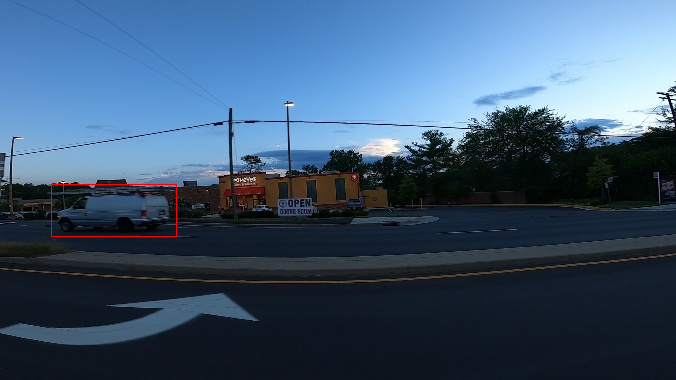

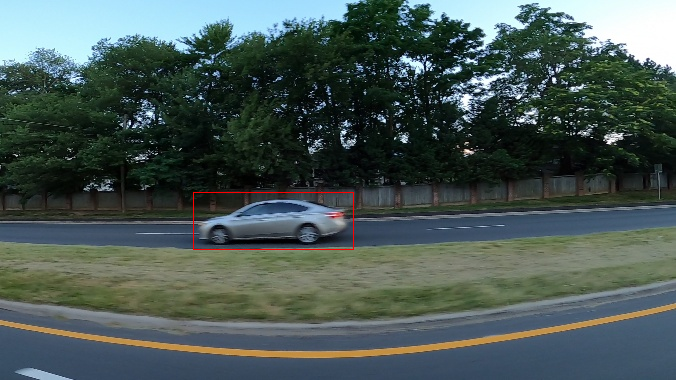

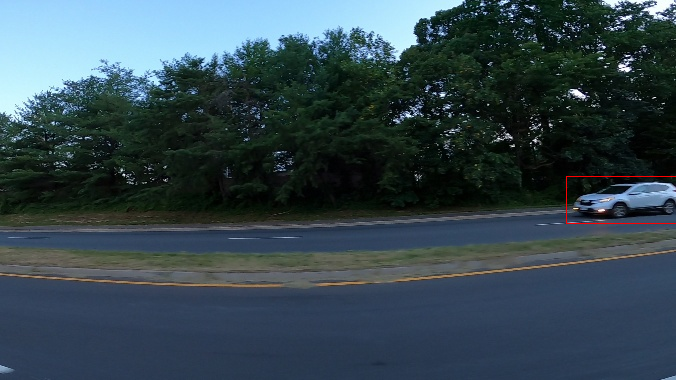

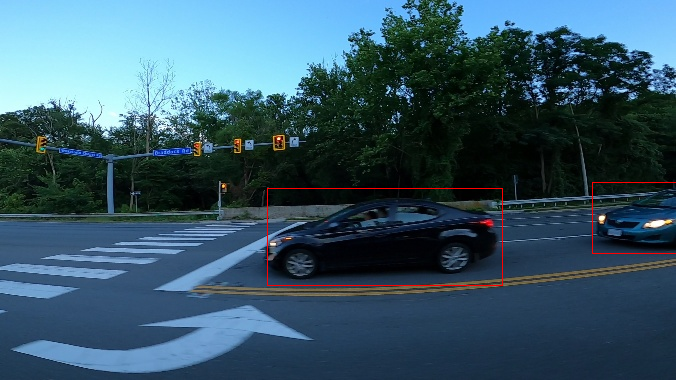

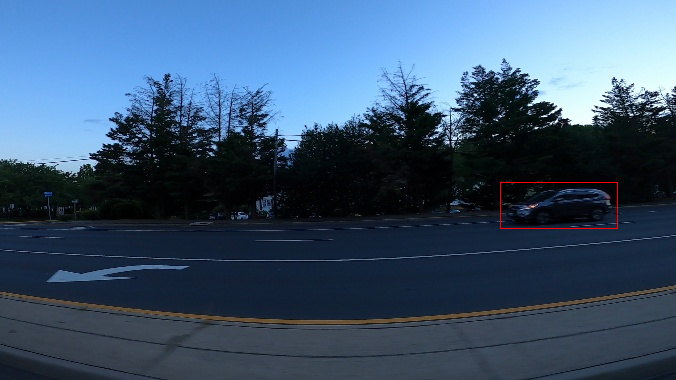

...

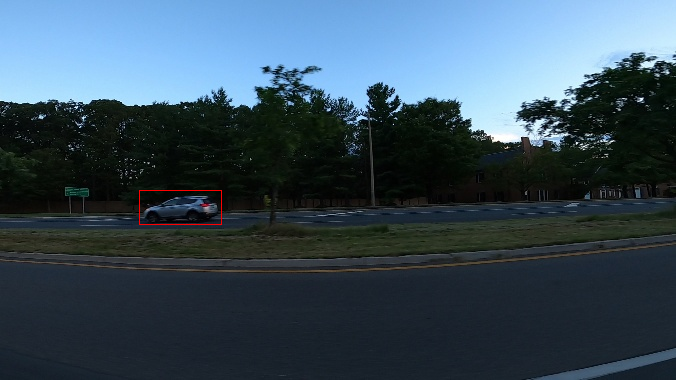

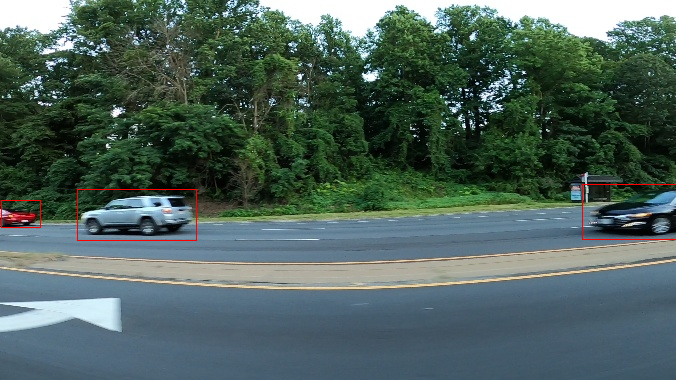

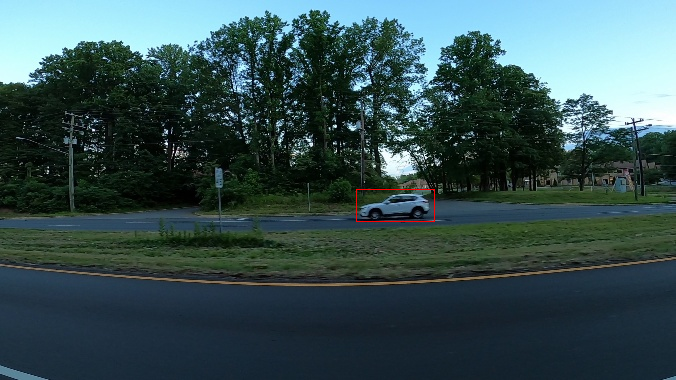

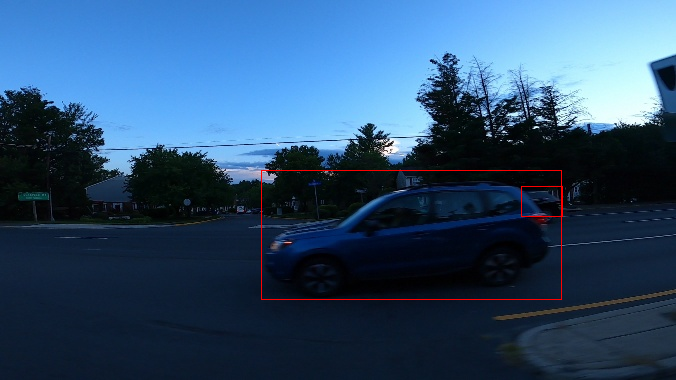

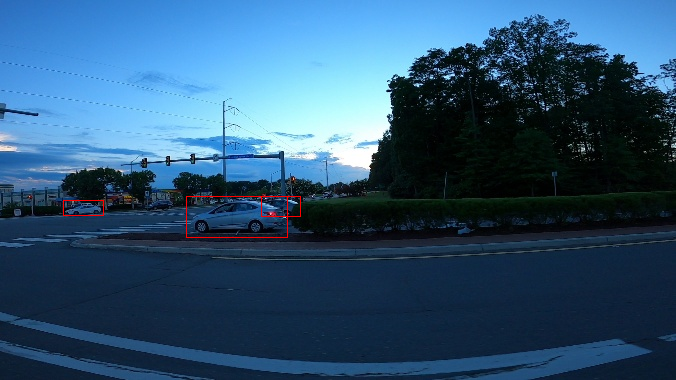

mAP =  tensor(-1., device='cuda:0')


In [16]:
disp_imgs(val_dl)